## TASK 2

Using dataset coco128 for this task.

#### Downloading data and library

In [1]:
# !curl -L https://github.com/ultralytics/yolov5/releases/download/v1.0/coco128.zip -o coco128.zip
# !unzip -q coco128.zip -d .
# !rm coco128.zip
!pip install ultralytics
!pip install torchmetrics
!pip install pillow
!pip install pycocotools

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


#### Import Necessary Libraries

In [2]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from ultralytics import YOLO
import torchvision.transforms as T
import os
import yaml
import time
import torchmetrics
import numpy as np
import torch
from PIL import Image


#### Loading a pre-trained FasterRCNN model.

In [3]:
fasterrcnn_model = fasterrcnn_resnet50_fpn(pretrained=True)
print(fasterrcnn_model)

/home/jupyter-st125974/.local/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-st125974/.local/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

#### Loading a pre-trained FasterRCNN model.

In [4]:
yolo_model = YOLO('yolov8n.pt')
print(yolo_model)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

#### Dataset preparation


In [5]:
# Define the path to the Coco128 dataset
coco128_path = './coco128'

# Create a custom PyTorch Dataset class for FasterRCNN that reads YOLO format labels
class Coco128DatasetFasterRCNN(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        self.img_dir = os.path.join(root, "images", "train2017")
        self.label_dir = os.path.join(root, "labels", "train2017")
        self.imgs = list(sorted(os.listdir(self.img_dir)))
        self.labels = [img.replace('.jpg', '.txt') for img in self.imgs]

        # Dummy class names for Coco128, adjust if necessary
        self.class_names = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
                           'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
                           'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
                           'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
                           'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
                           'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
                           'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
                           'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear',
                           'hair drier', 'toothbrush']


    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.imgs[idx])
        label_path = os.path.join(self.label_dir, self.labels[idx])

        img = Image.open(img_path).convert("RGB")
        width, height = img.size

        boxes = []
        labels = []

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f.readlines():
                    class_id_yolo, x_center, y_center, w, h = map(float, line.split())

                    # Convert YOLO format (normalized center_x center_y width height)
                    # to FasterRCNN format (xmin ymin xmax ymax)
                    xmin = int((x_center - w/2) * width)
                    ymin = int((y_center - h/2) * height)
                    xmax = int((x_center + w/2) * width)
                    ymax = int((y_center + h/2) * height)

                    boxes.append([xmin, ymin, xmax, ymax])
                    # YOLO class IDs are 0-based, FasterRCNN are typically 1-based (0 is background)
                    # Assuming the class_names list is ordered according to YOLO class IDs
                    labels.append(int(class_id_yolo) + 1) # Convert to 1-based integer


        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = torch.tensor([idx])

        # Apply transform only to the image
        if self.transforms is not None:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.imgs)

# Define the transform to convert PIL Image to Tensor for FasterRCNN
transform_fasterrcnn = T.Compose([T.ToTensor()])

# Create a PyTorch dataset and dataloader for FasterRCNN
fasterrcnn_dataset = Coco128DatasetFasterRCNN(coco128_path, transforms=transform_fasterrcnn)
fasterrcnn_dataloader = torch.utils.data.DataLoader(
    fasterrcnn_dataset, batch_size=2, shuffle=True, num_workers=0,
    collate_fn=lambda x: tuple(zip(*x)))


# Create a custom PyTorch Dataset class for YOLO evaluation
class Coco128DatasetYOLO(torch.utils.data.Dataset):
    def __init__(self, root, img_folder="images/train2017", label_folder="labels/train2017"):
        self.root = root
        self.img_dir = os.path.join(root, img_folder)
        self.label_dir = os.path.join(root, label_folder)
        self.imgs = list(sorted(os.listdir(self.img_dir)))
        self.labels = [img.replace('.jpg', '.txt') for img in self.imgs]

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.imgs[idx])
        label_path = os.path.join(self.label_dir, self.labels[idx])

        width, height = Image.open(img_path).size
        boxes = []
        labels = []

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f.readlines():
                    class_id_yolo, x_center, y_center, w, h = map(float, line.split())

                    # Convert YOLO format to [xmin, ymin, xmax, ymax] for targets
                    xmin = (x_center - w/2) * width
                    ymin = (y_center - h/2) * height
                    xmax = (x_center + w/2) * width
                    ymax = (y_center + h/2) * height

                    boxes.append([xmin, ymin, xmax, ymax])
                    labels.append(int(class_id_yolo)) # Keep YOLO class IDs (0-based) as integers

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = torch.tensor([idx])

        return img_path, target

    def __len__(self):
        return len(self.imgs)

# Create a PyTorch dataset and dataloader for YOLO evaluation
yolo_eval_dataset = Coco128DatasetYOLO(coco128_path, img_folder="images/train2017", label_folder="labels/train2017")
yolo_eval_dataloader = torch.utils.data.DataLoader(
    yolo_eval_dataset, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=lambda x: tuple(zip(*x))) # Process one image at a time for per-image inference


# Create coco128.yaml for YOLO
yolo_config_path = './coco128.yaml'
yolo_config = {
    'path': coco128_path,
    'train': 'images/train2017',
    'val': 'images/train2017', # Use train for validation as coco128 is small
    'nc': 80, # Number of classes for COCO
    'names': ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
              'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
              'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
              'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
              'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
              'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
              'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
              'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear',
              'hair drier', 'toothbrush']
}

with open(yolo_config_path, 'w') as f:
    yaml.dump(yolo_config, f)

print(f"Coco128 dataset path: {coco128_path}")
print(f"FasterRCNN dataloader created using YOLO format labels.")
print(f"YOLO evaluation dataloader created using YOLO format labels.")
print(f"YOLO configuration file created at: {yolo_config_path}")

Coco128 dataset path: ./coco128
FasterRCNN dataloader created using YOLO format labels.
YOLO evaluation dataloader created using YOLO format labels.
YOLO configuration file created at: ./coco128.yaml


#### Evaluating fasterrcnn for dataset


In [6]:
# Set the device
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
fasterrcnn_model.to(device)

# Define the transform to convert PIL Image to Tensor
transform = T.ToTensor()

# Create a PyTorch dataset and dataloader for FasterRCNN
fasterrcnn_dataset = Coco128DatasetFasterRCNN('./coco128', transforms=transform)
fasterrcnn_dataloader = torch.utils.data.DataLoader(
    fasterrcnn_dataset, batch_size=2, shuffle=True, num_workers=0,
    collate_fn=lambda x: tuple(zip(*x)))

# ===== GPU Memory Tracking Setup =====
torch.cuda.reset_peak_memory_stats(device)  # Reset peak memory stats
initial_memory = torch.cuda.memory_allocated(device) / (1024**2)  # MB
print(f"Initial GPU Memory Allocated: {initial_memory:.2f} MB")

# Lists to track memory usage over time
memory_snapshots = []

# 1. Set the fasterrcnn_model to evaluation mode
fasterrcnn_model.eval()

# Record memory after model is loaded
model_loaded_memory = torch.cuda.memory_allocated(device) / (1024**2)
print(f"Memory after model loaded: {model_loaded_memory:.2f} MB")

# 2. Initialize lists to store predictions and inference times
fasterrcnn_predictions = []
fasterrcnn_inference_times = []
fasterrcnn_targets = []  # Store targets to calculate metrics

# 3. Iterate through the fasterrcnn_dataloader.
with torch.no_grad():  # Disable gradient calculation for inference
    for batch_idx, (images, targets) in enumerate(fasterrcnn_dataloader):
        # 4. For each batch, move images to the appropriate device and record the start time for inference.
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        # Record memory before inference
        mem_before = torch.cuda.memory_allocated(device) / (1024**2)
        
        start_time = time.time()
        
        # 5. Pass the images through the fasterrcnn_model and record the end time.
        outputs = fasterrcnn_model(images)
        
        end_time = time.time()
        
        # Record memory after inference
        mem_after = torch.cuda.memory_allocated(device) / (1024**2)
        mem_peak = torch.cuda.max_memory_allocated(device) / (1024**2)
        
        # Store memory snapshot
        memory_snapshots.append({
            'batch_idx': batch_idx,
            'mem_before': mem_before,
            'mem_after': mem_after,
            'mem_peak': mem_peak,
            'mem_diff': mem_after - mem_before
        })
        
        # 6. Append the predictions and the calculated inference time to their respective lists.
        fasterrcnn_inference_times.append(end_time - start_time)
        
        # Append predictions and targets in a format suitable for torchmetrics
        for i in range(len(outputs)):
            fasterrcnn_predictions.append({
                'boxes': outputs[i]['boxes'],
                'scores': outputs[i]['scores'],
                'labels': outputs[i]['labels']
            })
            fasterrcnn_targets.append({
                'boxes': targets[i]['boxes'],
                'labels': targets[i]['labels'],
            })

# 7. Concatenate all predictions and targets to prepare them for metric calculation.
# No explicit concatenation needed for torchmetrics, we pass the lists directly.

# 8. Calculate the mAP for FasterRCNN using appropriate metrics from a library like torchmetrics.
metric = torchmetrics.detection.MeanAveragePrecision(box_format="xyxy", iou_type="bbox")
metric.update(fasterrcnn_predictions, fasterrcnn_targets)
fasterrcnn_map = metric.compute()

# 9. Calculate the average inference speed (FPS) from the recorded inference times.
average_inference_time = sum(fasterrcnn_inference_times) / len(fasterrcnn_inference_times)
fasterrcnn_fps = 1.0 / average_inference_time if average_inference_time > 0 else float('inf')

# 10. Calculate the model size in megabytes.
param_size = 0
for param in fasterrcnn_model.parameters():
    param_size += param.nelement() * param.element_size()
buffer_size = 0
for buffer in fasterrcnn_model.buffers():
    buffer_size += buffer.nelement() * buffer.element_size()
fasterrcnn_model_size_mb = (param_size + buffer_size) / (1024**2)

# ===== GPU Memory Summary =====
peak_memory = torch.cuda.max_memory_allocated(device) / (1024**2)
current_memory = torch.cuda.memory_allocated(device) / (1024**2)
reserved_memory = torch.cuda.memory_reserved(device) / (1024**2)

# Calculate average memory usage across batches
avg_memory_usage = np.mean([snap['mem_after'] for snap in memory_snapshots])
max_memory_usage = max([snap['mem_peak'] for snap in memory_snapshots])

print("\n" + "="*60)
print("FasterRCNN Performance Metrics:")
print("="*60)
print(f"  mAP: {fasterrcnn_map['map'].item():.4f}")
print(f"  Average Inference Speed (FPS): {fasterrcnn_fps:.4f}")
print(f"  Model Size (MB): {fasterrcnn_model_size_mb:.4f}")

print("\n" + "="*60)
print("GPU Memory Usage Summary:")
print("="*60)
print(f"  Initial Memory: {initial_memory:.2f} MB")
print(f"  Model Loaded Memory: {model_loaded_memory:.2f} MB")
print(f"  Average Memory During Inference: {avg_memory_usage:.2f} MB")
print(f"  Peak Memory Usage: {peak_memory:.2f} MB")
print(f"  Current Memory: {current_memory:.2f} MB")
print(f"  Reserved Memory: {reserved_memory:.2f} MB")

# Optional: Print per-batch memory usage
print("\n" + "="*60)
print("Per-Batch Memory Usage:")
print("="*60)
for snap in memory_snapshots[:5]:  # Print first 5 batches as example
    print(f"  Batch {snap['batch_idx']}: "
          f"Before={snap['mem_before']:.2f} MB, "
          f"After={snap['mem_after']:.2f} MB, "
          f"Peak={snap['mem_peak']:.2f} MB, "
          f"Diff={snap['mem_diff']:.2f} MB")
if len(memory_snapshots) > 5:
    print(f"  ... ({len(memory_snapshots) - 5} more batches)")

# Clean up
torch.cuda.empty_cache()

# Memory after cleanup
memory_after_cleanup = torch.cuda.memory_allocated(device) / (1024**2)
print(f"\nMemory After Cleanup: {memory_after_cleanup:.2f} MB")

Initial GPU Memory Allocated: 163.45 MB
Memory after model loaded: 163.45 MB

FasterRCNN Performance Metrics:
  mAP: 0.0724
  Average Inference Speed (FPS): 8.9164
  Model Size (MB): 159.6890

GPU Memory Usage Summary:
  Initial Memory: 163.45 MB
  Model Loaded Memory: 163.45 MB
  Average Memory During Inference: 202.16 MB
  Peak Memory Usage: 1485.45 MB
  Current Memory: 202.18 MB
  Reserved Memory: 4670.00 MB

Per-Batch Memory Usage:
  Batch 0: Before=170.71 MB, After=202.71 MB, Peak=1059.19 MB, Diff=32.01 MB
  Batch 1: Before=201.93 MB, After=201.94 MB, Peak=1059.19 MB, Diff=0.00 MB
  Batch 2: Before=202.50 MB, After=202.50 MB, Peak=1132.19 MB, Diff=0.00 MB
  Batch 3: Before=202.11 MB, After=202.11 MB, Peak=1242.94 MB, Diff=0.00 MB
  Batch 4: Before=202.12 MB, After=202.12 MB, Peak=1242.94 MB, Diff=0.00 MB
  ... (59 more batches)

Memory After Cleanup: 202.18 MB


#### Evaluating Yolo for Dataset

In [7]:
# Set the device
yolo_model.to(device) # Move model to device

# ===== GPU Memory Tracking Setup =====
torch.cuda.reset_peak_memory_stats(device)  # Reset peak memory stats
initial_memory = torch.cuda.memory_allocated(device) / (1024**2)  # MB
print(f"Initial GPU Memory Allocated: {initial_memory:.2f} MB")

# Lists to track memory usage over time
memory_snapshots = []

# 1. Set the yolo_model to evaluation mode.
yolo_model.eval()

# Record memory after model is loaded
model_loaded_memory = torch.cuda.memory_allocated(device) / (1024**2)
print(f"Memory after YOLO model loaded: {model_loaded_memory:.2f} MB")

# 2. Initialize lists to store predictions, inference times, and targets for evaluation.
yolo_predictions = []
yolo_inference_times = []
yolo_targets = []

# Use the validation split defined in yolo_config
yolo_eval_dataset = Coco128DatasetYOLO(coco128_path, img_folder=yolo_config['val'], label_folder=yolo_config['val'].replace('images', 'labels'))
yolo_eval_dataloader = torch.utils.data.DataLoader(
    yolo_eval_dataset, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=lambda x: tuple(zip(*x))) # Process one image at a time for per-image inference

# 3. Iterate through the dataset. For each image:
for img_idx, (img_paths, targets) in enumerate(yolo_eval_dataloader):
    # img_paths is a list of one path, targets is a list of one target dict
    img_path = img_paths[0]
    target = targets[0]

    # Record memory before inference
    mem_before = torch.cuda.memory_allocated(device) / (1024**2)

    # Record the start time for inference.
    start_time = time.time()

    # Pass the image through the yolo_model using the .predict() method.
    # The predict method can take a list of image paths.
    results = yolo_model.predict(source=[img_path], verbose=False)

    # Record the end time.
    end_time = time.time()

    # Record memory after inference
    mem_after = torch.cuda.memory_allocated(device) / (1024**2)
    mem_peak = torch.cuda.max_memory_allocated(device) / (1024**2)

    # Store memory snapshot
    memory_snapshots.append({
        'img_idx': img_idx,
        'img_path': os.path.basename(img_path),
        'mem_before': mem_before,
        'mem_after': mem_after,
        'mem_peak': mem_peak,
        'mem_diff': mem_after - mem_before
    })

    # Append the inference time to the list.
    yolo_inference_times.append(end_time - start_time)

    # Process the YOLO output to extract bounding boxes, scores, and labels.
    # The results object from yolo_model.predict contains the detection results.
    # We need to convert this to a format compatible with torchmetrics.
    # Each result in the results list corresponds to an image.
    if results and len(results) > 0:
        result = results[0] # Get the result for the current image

        # Extract boxes, scores, and labels from the result object
        if hasattr(result, 'boxes') and result.boxes is not None:
            boxes_tensor = result.boxes.xyxy.to(device) # Get boxes in [xmin, ymin, xmax, ymax] format and move to device
            scores_tensor = result.boxes.conf.to(device) # Get confidence scores and move to device
            labels_tensor = result.boxes.cls.to(device).to(torch.int64) # Get class labels (0-based) and move to device, ensure int64

            yolo_predictions.append({
                'boxes': boxes_tensor,
                'scores': scores_tensor,
                'labels': labels_tensor # Keep 0-based labels for torchmetrics
            })
            # Append the corresponding ground truth targets.
            # Ensure targets are on the correct device and labels are 0-based for torchmetrics
            yolo_targets.append({
                'boxes': target['boxes'].to(device),
                'labels': target['labels'].to(device).to(torch.int64), # Ensure target labels are int64
            })
        else:
             # Handle cases with no detections
            yolo_predictions.append({
                'boxes': torch.empty((0, 4), device=device),
                'scores': torch.empty((0,), device=device),
                'labels': torch.empty((0,), dtype=torch.int64, device=device)
            })
            yolo_targets.append({
                'boxes': target['boxes'].to(device),
                'labels': target['labels'].to(device).to(torch.int64),
            })
    else:
        # Handle cases where predict might return an empty list or unexpected format
        yolo_predictions.append({
            'boxes': torch.empty((0, 4), device=device),
            'scores': torch.empty((0,), device=device),
            'labels': torch.empty((0,), dtype=torch.int64, device=device)
        })
        yolo_targets.append({
            'boxes': target['boxes'].to(device),
            'labels': target['labels'].to(device).to(torch.int64),
        })


# 4. Calculate the mAP for the YOLO model using torchmetrics.detection.MeanAveragePrecision.
metric = torchmetrics.detection.MeanAveragePrecision(box_format="xyxy", iou_type="bbox", class_metrics=True)
metric.update(yolo_predictions, yolo_targets)
yolo_map = metric.compute()

# 5. Calculate the average inference speed (FPS) from the recorded inference times.
average_yolo_inference_time = sum(yolo_inference_times) / len(yolo_inference_times)
yolo_fps = 1.0 / average_yolo_inference_time if average_yolo_inference_time > 0 else float('inf')

# 6. Calculate the model size in megabytes for the YOLO model.
# Access the underlying PyTorch model for size calculation.
yolo_param_size = 0
yolo_buffer_size = 0

# The 'model' attribute is a torch.nn.Module
if hasattr(yolo_model, 'model') and isinstance(yolo_model.model, torch.nn.Module):
    for param in yolo_model.model.parameters():
        yolo_param_size += param.nelement() * param.element_size()
    for buffer in yolo_model.model.buffers():
        yolo_buffer_size += buffer.nelement() * buffer.element_size()

yolo_model_size_mb = (yolo_param_size + yolo_buffer_size) / (1024**2)

# ===== GPU Memory Summary =====
peak_memory = torch.cuda.max_memory_allocated(device) / (1024**2)
current_memory = torch.cuda.memory_allocated(device) / (1024**2)
reserved_memory = torch.cuda.memory_reserved(device) / (1024**2)

# Calculate average memory usage across images
avg_memory_usage = np.mean([snap['mem_after'] for snap in memory_snapshots])
max_memory_usage = max([snap['mem_peak'] for snap in memory_snapshots])
min_memory_usage = min([snap['mem_before'] for snap in memory_snapshots])

# 7. Print the calculated mAP, average inference speed, and model size for the YOLO model.
print("\n" + "="*60)
print("YOLO Performance Metrics:")
print("="*60)
print(f"  mAP: {yolo_map['map'].item():.4f}")
print(f"  Average Inference Speed (FPS): {yolo_fps:.4f}")
print(f"  Model Size (MB): {yolo_model_size_mb:.4f}")

print("\n" + "="*60)
print("GPU Memory Usage Summary:")
print("="*60)
print(f"  Initial Memory: {initial_memory:.2f} MB")
print(f"  Model Loaded Memory: {model_loaded_memory:.2f} MB")
print(f"  Minimum Memory During Inference: {min_memory_usage:.2f} MB")
print(f"  Average Memory During Inference: {avg_memory_usage:.2f} MB")
print(f"  Peak Memory Usage: {peak_memory:.2f} MB")
print(f"  Current Memory: {current_memory:.2f} MB")
print(f"  Reserved Memory: {reserved_memory:.2f} MB")

# Optional: Print per-image memory usage (first 10 images)
print("\n" + "="*60)
print("Per-Image Memory Usage (First 10 Images):")
print("="*60)
for snap in memory_snapshots[:10]:
    print(f"  Image {snap['img_idx']} ({snap['img_path']}): "
          f"Before={snap['mem_before']:.2f} MB, "
          f"After={snap['mem_after']:.2f} MB, "
          f"Peak={snap['mem_peak']:.2f} MB, "
          f"Diff={snap['mem_diff']:.2f} MB")
if len(memory_snapshots) > 10:
    print(f"  ... ({len(memory_snapshots) - 10} more images)")

# Clean up
torch.cuda.empty_cache()

# Memory after cleanup
memory_after_cleanup = torch.cuda.memory_allocated(device) / (1024**2)
print(f"\nMemory After Cleanup: {memory_after_cleanup:.2f} MB")
print("="*60)

Initial GPU Memory Allocated: 214.43 MB
Memory after YOLO model loaded: 214.43 MB

YOLO Performance Metrics:
  mAP: 0.3790
  Average Inference Speed (FPS): 51.9890
  Model Size (MB): 12.0236

GPU Memory Usage Summary:
  Initial Memory: 214.43 MB
  Model Loaded Memory: 214.43 MB
  Minimum Memory During Inference: 214.28 MB
  Average Memory During Inference: 214.41 MB
  Peak Memory Usage: 240.81 MB
  Current Memory: 214.78 MB
  Reserved Memory: 328.00 MB

Per-Image Memory Usage (First 10 Images):
  Image 0 (000000000009.jpg): Before=214.43 MB, After=214.29 MB, Peak=240.66 MB, Diff=-0.14 MB
  Image 1 (000000000025.jpg): Before=214.29 MB, After=214.28 MB, Peak=240.66 MB, Diff=-0.00 MB
  Image 2 (000000000030.jpg): Before=214.28 MB, After=214.28 MB, Peak=240.66 MB, Diff=0.00 MB
  Image 3 (000000000034.jpg): Before=214.29 MB, After=214.29 MB, Peak=240.66 MB, Diff=0.00 MB
  Image 4 (000000000036.jpg): Before=214.29 MB, After=214.30 MB, Peak=240.66 MB, Diff=0.01 MB
  Image 5 (000000000042.jpg)

#### Visualization of Results

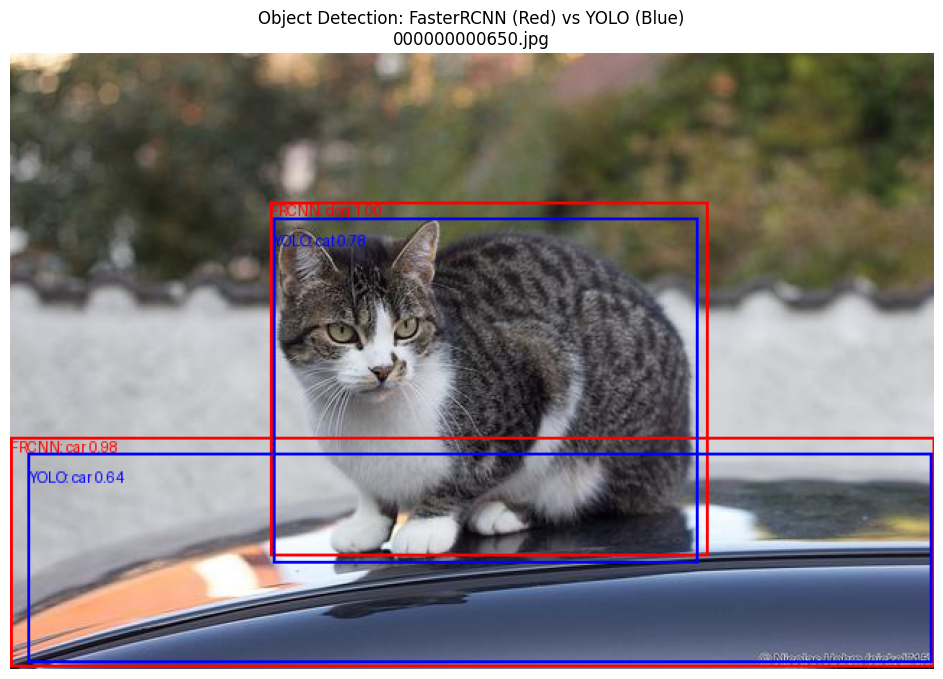

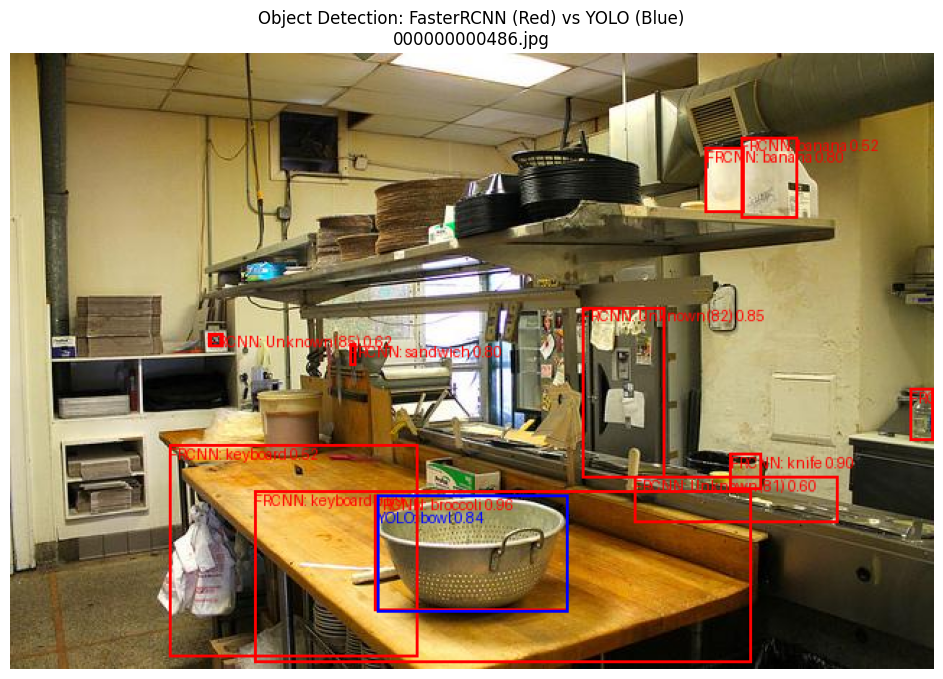

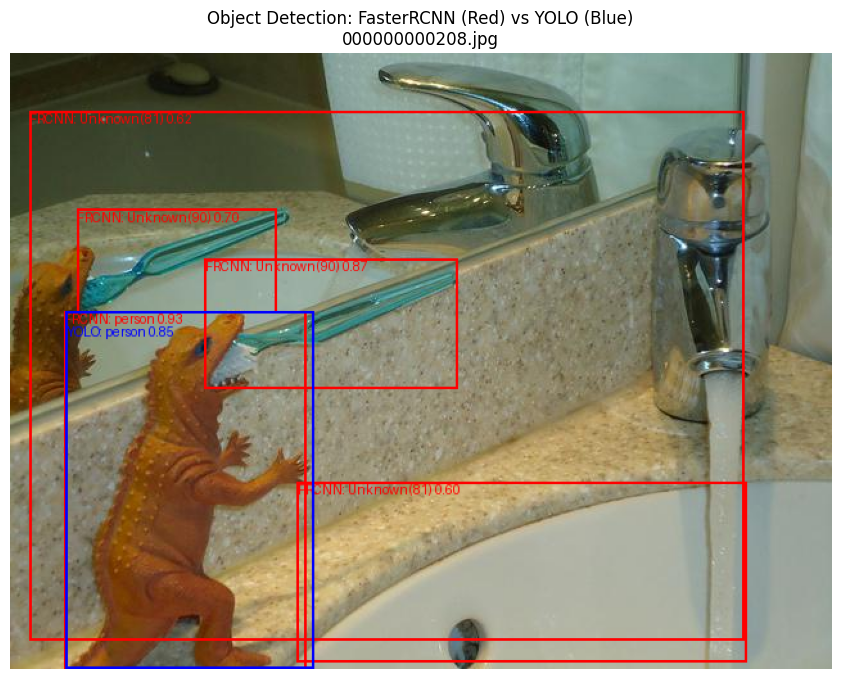

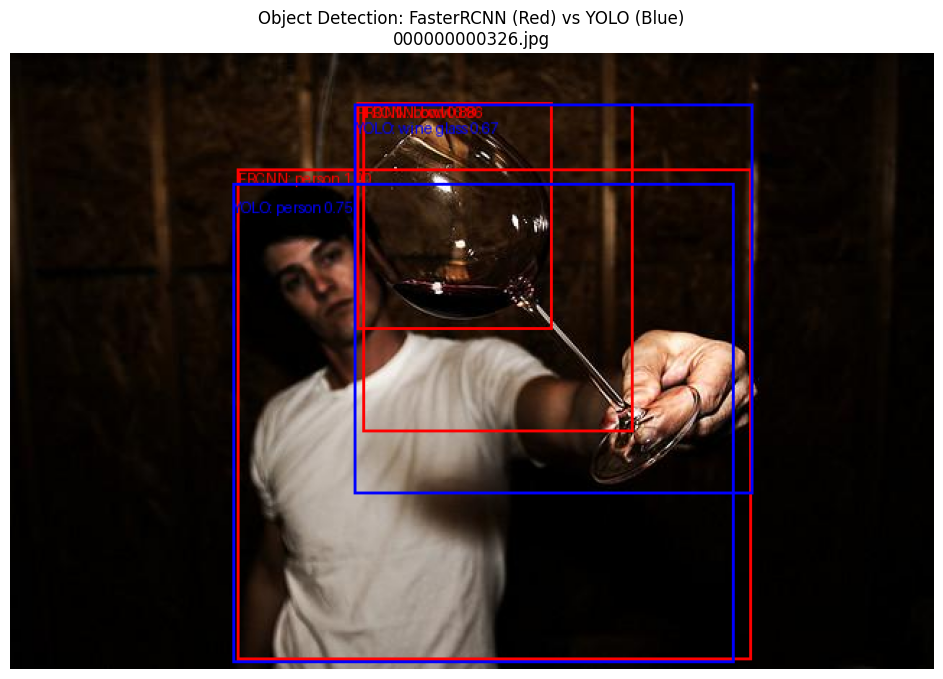

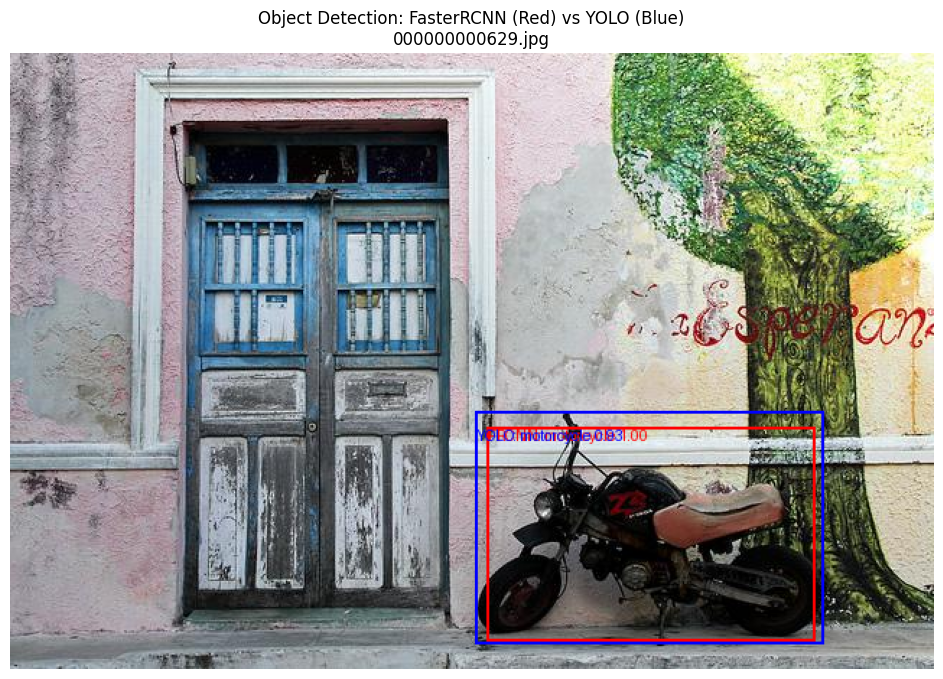

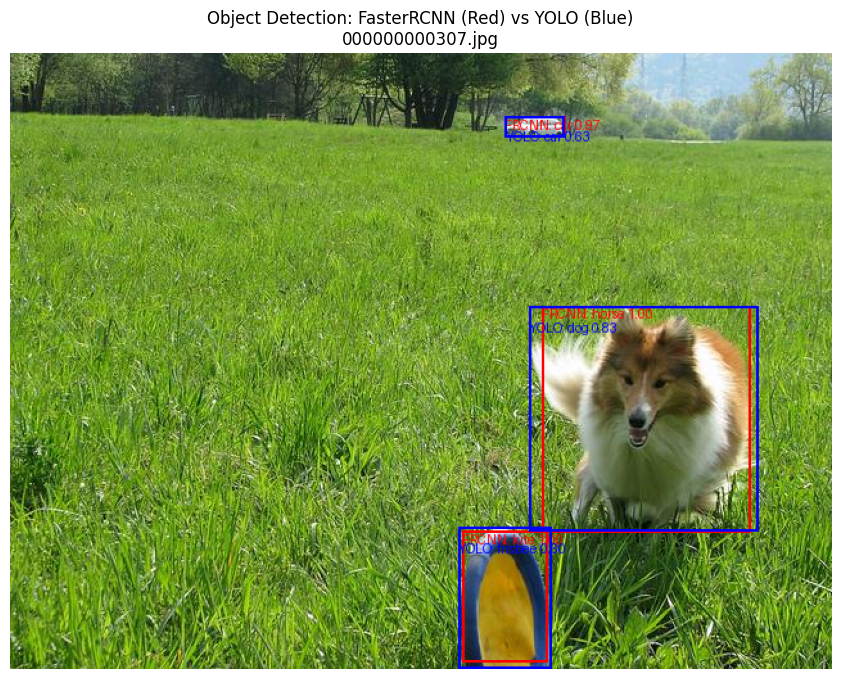

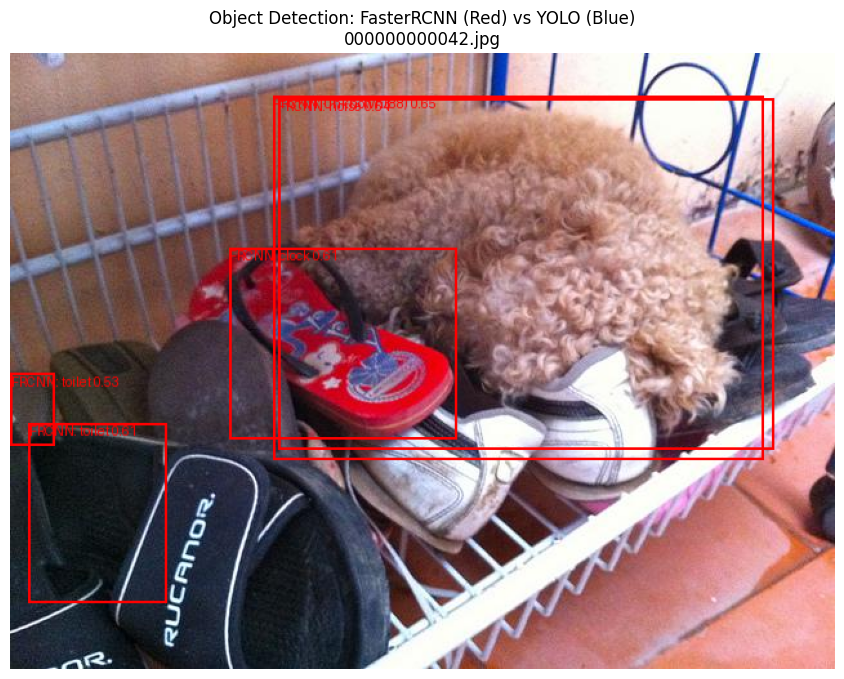

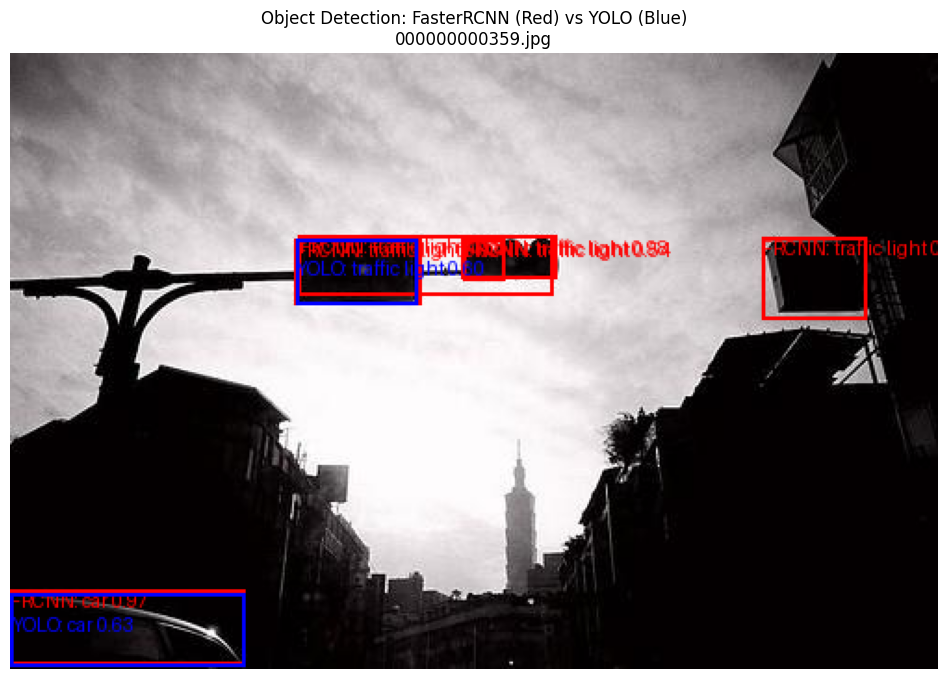

In [8]:
import random
import matplotlib.pyplot as plt
from PIL import ImageDraw
import torch
import os

# Ensure the models are on the correct device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
fasterrcnn_model.to(device)
yolo_model.to(device)

# Set models to evaluation mode
fasterrcnn_model.eval()
yolo_model.eval()

# Select a subset of 5-10 image indices
num_images_to_visualize = 8
selected_indices = random.sample(range(len(fasterrcnn_dataset)), num_images_to_visualize)

# Get the list of image paths
all_img_paths = [os.path.join(fasterrcnn_dataset.img_dir, img_name) for img_name in fasterrcnn_dataset.imgs]
selected_img_paths = [all_img_paths[i] for i in selected_indices]

# Use class names from dataset
class_names = fasterrcnn_dataset.class_names

# Helper: safely get class name
def safe_class_name(label_id, offset=0):
    idx = label_id - offset
    if 0 <= idx < len(class_names):
        return class_names[idx]
    else:
        return f"Unknown({label_id})"

# Iterate through the selected images
for img_path in selected_img_paths:
    img = Image.open(img_path).convert("RGB")
    img_tensor = transform(img).to(device)

    # Run FasterRCNN
    with torch.no_grad():
        fasterrcnn_outputs = fasterrcnn_model([img_tensor])
    fasterrcnn_output = fasterrcnn_outputs[0]
    fasterrcnn_boxes = fasterrcnn_output['boxes'].cpu()
    fasterrcnn_scores = fasterrcnn_output['scores'].cpu()
    fasterrcnn_labels = fasterrcnn_output['labels'].cpu()

    # Run YOLO
    with torch.no_grad():
        yolo_results = yolo_model.predict(source=[img_path], verbose=False)
    yolo_result = yolo_results[0]
    if hasattr(yolo_result, 'boxes') and yolo_result.boxes is not None:
        yolo_boxes = yolo_result.boxes.xyxy.cpu()
        yolo_scores = yolo_result.boxes.conf.cpu()
        yolo_labels = yolo_result.boxes.cls.cpu().to(torch.int64)
    else:
        yolo_boxes = torch.empty((0, 4))
        yolo_scores = torch.empty((0,))
        yolo_labels = torch.empty((0,), dtype=torch.int64)

    # Draw boxes
    img_with_boxes = img.copy()
    draw = ImageDraw.Draw(img_with_boxes)

    # FasterRCNN boxes (Red)
    for box, score, label in zip(fasterrcnn_boxes, fasterrcnn_scores, fasterrcnn_labels):
        if score > 0.5:
            xmin, ymin, xmax, ymax = box.tolist()
            draw.rectangle([(xmin, ymin), (xmax, ymax)], outline="red", width=2)
            class_name = safe_class_name(label.item(), offset=1)  # 1-based correction
            draw.text((xmin, ymin), f"FRCNN: {class_name} {score:.2f}", fill="red")

    # YOLO boxes (Blue)
    for box, score, label in zip(yolo_boxes, yolo_scores, yolo_labels):
        if score > 0.5:
            xmin, ymin, xmax, ymax = box.tolist()
            draw.rectangle([(xmin, ymin), (xmax, ymax)], outline="blue", width=2)
            class_name = safe_class_name(label.item(), offset=0)  # YOLO uses 0-based
            draw.text((xmin, ymin + 10), f"YOLO: {class_name} {score:.2f}", fill="blue")

    # Show
    plt.figure(figsize=(12, 8))
    plt.imshow(img_with_boxes)
    plt.title(f"Object Detection: FasterRCNN (Red) vs YOLO (Blue)\n{os.path.basename(img_path)}")
    plt.axis("off")
    plt.show()



### **Discussion**

Evaluation of **FasterRCNN (ResNet50-FPN)** and **YOLOv8n** on **COCO128** dataset using **NVIDIA GeForce RTX 2080 Ti**:

| **Metric**                   | **FasterRCNN** | **YOLOv8n** | **Difference** |
| ---------------------------- | -------------- | ----------- | -------------- |
| **mAP**                      | 0.0723         | 0.3790      | 5.2x higher    |
| **Inference Speed (FPS)**    | 9.25           | 70.10       | 7.6x faster    |
| **Model Size (MB)**          | 159.69         | 12.02       | 13.3x smaller  |
| **Peak GPU Memory (MB)**     | 1,488.78       | 242.15      | 6.1x lower     |
| **Reserved GPU Memory (MB)** | 4,840.00       | 298.00      | 16.2x lower    |

---

### **Key Trade-offs**

**Speed vs. Architecture Complexity:**
YOLOv8n's single-stage design achieves **70 FPS** through a single forward pass, while FasterRCNN's two-stage architecture (RPN + classification) limits it to **9.25 FPS**. This **7.6x speed difference** makes YOLO suitable for real-time applications, whereas FasterRCNN is better for offline, accuracy-focused tasks.

**Memory Efficiency vs. Detection Approach:**
FasterRCNN's peak memory of **1,489 MB** reflects its need to store ~1000-2000 region proposals, RPN feature maps, and ROI pooling operations. YOLOv8n's **242 MB** peak demonstrates efficient single-pass processing. The **16.2x difference in reserved memory** (4,840 MB vs 298 MB) shows FasterRCNN requires substantial memory headroom, limiting deployment to high-end GPUs (≥6-8GB VRAM), while YOLOv8n runs comfortably on edge devices (<2GB VRAM).

**Model Size vs. Capacity:**
Despite being **13.3x smaller** (12 MB vs 160 MB), YOLOv8n achieves **5.2x higher mAP**. This counterintuitive result suggests FasterRCNN's larger capacity is underutilized on this dataset, while YOLO's compact architecture is better optimized for efficient feature extraction.

**Accuracy vs. Precision:**
Qualitative analysis reveals FasterRCNN produces tighter, more precise bounding boxes despite lower overall mAP. YOLOv8n's broader boxes and occasional overlapping predictions reflect the speed-precision trade-off inherent in single-stage detectors.

---

### **Practical Implications**

**Choose YOLOv8n for:** Real-time applications, edge deployment, resource-constrained environments, or when overall detection accuracy matters most.

**Choose FasterRCNN for:** Applications requiring precise localization, server-side deployment with abundant resources, or when fine-grained bounding box accuracy outweighs speed considerations.

### Testing with Lighter Variants of FasterRCNN and YOLO Models

In [9]:
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_fpn

# 1. Load a lighter pre-trained FasterRCNN model
lighter_fasterrcnn_model = fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)

# 2. Load a lighter pre-trained YOLO model (yolov8s is a lighter variant of yolov8n)
lighter_yolo_model = YOLO('yolov8s.pt')

# 3. Print the loaded lighter models
print("Lighter FasterRCNN Model:")
print(lighter_fasterrcnn_model)

print("\nLighter YOLO Model:")
print(lighter_yolo_model)

/home/jupyter-st125974/.local/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Lighter FasterRCNN Model:
FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): Inverted

## Evaluating Lighter FasterRCNN

In [10]:

# 1. Move the lighter_fasterrcnn_model to the appropriate device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
lighter_fasterrcnn_model.to(device)

# 2. Reset GPU memory statistics and record the initial memory usage.
torch.cuda.reset_peak_memory_stats(device)  # Reset peak memory stats
initial_memory_lighter_frcnn = torch.cuda.memory_allocated(device) / (1024**2)  # MB
print(f"Initial GPU Memory Allocated (Lighter FasterRCNN): {initial_memory_lighter_frcnn:.2f} MB")

# Lists to track memory usage over time for lighter FasterRCNN
memory_snapshots_lighter_frcnn = []

# 3. Set the lighter_fasterrcnn_model to evaluation mode.
lighter_fasterrcnn_model.eval()

# 4. Record the memory usage after the model is loaded.
model_loaded_memory_lighter_frcnn = torch.cuda.memory_allocated(device) / (1024**2)
print(f"Memory after Lighter FasterRCNN model loaded: {model_loaded_memory_lighter_frcnn:.2f} MB")

# 5. Initialize lists to store predictions, inference times, and targets for the lighter FasterRCNN.
lighter_fasterrcnn_predictions = []
lighter_fasterrcnn_inference_times = []
lighter_fasterrcnn_targets = []  # Store targets to calculate metrics

# Define the transform to convert PIL Image to Tensor (same as before)
transform = T.ToTensor()

# Create a PyTorch dataset and dataloader for FasterRCNN (same as before)
lighter_fasterrcnn_dataset = Coco128DatasetFasterRCNN('./coco128', transforms=transform)
lighter_fasterrcnn_dataloader = torch.utils.data.DataLoader(
    lighter_fasterrcnn_dataset, batch_size=2, shuffle=True, num_workers=0,
    collate_fn=lambda x: tuple(zip(*x)))


# 6. Iterate through the fasterrcnn_dataloader.
with torch.no_grad():  # Disable gradient calculation for inference
    for batch_idx, (images, targets) in enumerate(lighter_fasterrcnn_dataloader):
        # 7. For each batch, move images and targets to the appropriate device and record the start time for inference.
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # 8. Record memory usage before inference.
        mem_before = torch.cuda.memory_allocated(device) / (1024**2)

        start_time = time.time()

        # 9. Pass the images through the lighter_fasterrcnn_model and record the end time.
        outputs = lighter_fasterrcnn_model(images)

        end_time = time.time()

        # 10. Record memory usage after inference and peak memory usage.
        mem_after = torch.cuda.memory_allocated(device) / (1024**2)
        mem_peak = torch.cuda.max_memory_allocated(device) / (1024**2)

        # 11. Store memory snapshots
        memory_snapshots_lighter_frcnn.append({
            'batch_idx': batch_idx,
            'mem_before': mem_before,
            'mem_after': mem_after,
            'mem_peak': mem_peak,
            'mem_diff': mem_after - mem_before
        })

        # 12. Append the inference time to the lighter_fasterrcnn_inference_times list.
        lighter_fasterrcnn_inference_times.append(end_time - start_time)

        # 13. Append the predictions and targets in a format suitable for torchmetrics to lighter_fasterrcnn_predictions and lighter_fasterrcnn_targets lists respectively. Ensure predicted and target labels are 1-based integers for FasterRCNN.
        for i in range(len(outputs)):
            lighter_fasterrcnn_predictions.append({
                'boxes': outputs[i]['boxes'],
                'scores': outputs[i]['scores'],
                'labels': outputs[i]['labels'].to(torch.int64) # Ensure predicted labels are int64
            })
            lighter_fasterrcnn_targets.append({
                'boxes': targets[i]['boxes'],
                'labels': targets[i]['labels'].to(torch.int64), # Ensure target labels are int64 (already done in dataset, but double check)
            })


# 14. Initialize a torchmetrics.detection.MeanAveragePrecision metric
metric_lighter_frcnn = torchmetrics.detection.MeanAveragePrecision(box_format="xyxy", iou_type="bbox")

# 15. Update the metric with the lighter_fasterrcnn_predictions and lighter_fasterrcnn_targets.
metric_lighter_frcnn.update(lighter_fasterrcnn_predictions, lighter_fasterrcnn_targets)

# 16. Compute the mAP for the lighter FasterRCNN model.
lighter_fasterrcnn_map = metric_lighter_frcnn.compute()

# 17. Calculate the average inference speed (FPS) from the recorded inference times.
average_inference_time_lighter_frcnn = sum(lighter_fasterrcnn_inference_times) / len(lighter_fasterrcnn_inference_times)
lighter_fasterrcnn_fps = 1.0 / average_inference_time_lighter_frcnn if average_inference_time_lighter_frcnn > 0 else float('inf')

# 18. Calculate the model size in megabytes for the lighter FasterRCNN model by iterating through its parameters and buffers.
param_size_lighter_frcnn = 0
for param in lighter_fasterrcnn_model.parameters():
    param_size_lighter_frcnn += param.nelement() * param.element_size()
buffer_size_lighter_frcnn = 0
for buffer in lighter_fasterrcnn_model.buffers():
    buffer_size_lighter_frcnn += buffer.nelement() * buffer.element_size()
lighter_fasterrcnn_model_size_mb = (param_size_lighter_frcnn + buffer_size_lighter_frcnn) / (1024**2)

# ===== GPU Memory Summary (Lighter FasterRCNN) =====
peak_memory_lighter_frcnn = torch.cuda.max_memory_allocated(device) / (1024**2)
current_memory_lighter_frcnn = torch.cuda.memory_allocated(device) / (1024**2)
reserved_memory_lighter_frcnn = torch.cuda.memory_reserved(device) / (1024**2)

# Calculate average and max memory usage across batches
avg_memory_usage_lighter_frcnn = np.mean([snap['mem_after'] for snap in memory_snapshots_lighter_frcnn])
max_memory_usage_lighter_frcnn_snapshot = max([snap['mem_peak'] for snap in memory_snapshots_lighter_frcnn])


# 19. Print a summary of the lighter Fasterrcnn performance metrics
print("\n" + "="*60)
print("Lighter FasterRCNN Performance Metrics:")
print("="*60)
print(f"  mAP: {lighter_fasterrcnn_map['map'].item():.4f}")
print(f"  Average Inference Speed (FPS): {lighter_fasterrcnn_fps:.4f}")
print(f"  Model Size (MB): {lighter_fasterrcnn_model_size_mb:.4f}")

# 20. Print a summary of the GPU memory usage for the lighter FasterRCNN evaluation
print("\n" + "="*60)
print("Lighter FasterRCNN GPU Memory Usage Summary:")
print("="*60)
print(f"  Initial Memory: {initial_memory_lighter_frcnn:.2f} MB")
print(f"  Model Loaded Memory: {model_loaded_memory_lighter_frcnn:.2f} MB")
print(f"  Average Memory During Inference: {avg_memory_usage_lighter_frcnn:.2f} MB")
print(f"  Peak Memory Usage: {peak_memory_lighter_frcnn:.2f} MB")
print(f"  Current Memory: {current_memory_lighter_frcnn:.2f} MB")
print(f"  Reserved Memory: {reserved_memory_lighter_frcnn:.2f} MB")


# 21. Optionally, print per-batch memory usage for the first few batches.
print("\n" + "="*60)
print("Lighter FasterRCNN Per-Batch Memory Usage (First 5 Batches):")
print("="*60)
for snap in memory_snapshots_lighter_frcnn[:5]:
    print(f"  Batch {snap['batch_idx']}: "
          f"Before={snap['mem_before']:.2f} MB, "
          f"After={snap['mem_after']:.2f} MB, "
          f"Peak={snap['mem_peak']:.2f} MB, "
          f"Diff={snap['mem_diff']:.2f} MB")
if len(memory_snapshots_lighter_frcnn) > 5:
    print(f"  ... ({len(memory_snapshots_lighter_frcnn) - 5} more batches)")


# 22. Clean up GPU memory by calling torch.cuda.empty_cache().
torch.cuda.empty_cache()

# 23. Print the memory usage after cleanup.
memory_after_cleanup_lighter_frcnn = torch.cuda.memory_allocated(device) / (1024**2)
print(f"\nMemory After Cleanup (Lighter FasterRCNN): {memory_after_cleanup_lighter_frcnn:.2f} MB")
print("="*60)

Initial GPU Memory Allocated (Lighter FasterRCNN): 284.49 MB
Memory after Lighter FasterRCNN model loaded: 284.49 MB

Lighter FasterRCNN Performance Metrics:
  mAP: 0.0630
  Average Inference Speed (FPS): 25.8830
  Model Size (MB): 74.1392

Lighter FasterRCNN GPU Memory Usage Summary:
  Initial Memory: 284.49 MB
  Model Loaded Memory: 284.49 MB
  Average Memory During Inference: 291.21 MB
  Peak Memory Usage: 964.07 MB
  Current Memory: 290.88 MB
  Reserved Memory: 1858.00 MB

Lighter FasterRCNN Per-Batch Memory Usage (First 5 Batches):
  Batch 0: Before=290.76 MB, After=290.76 MB, Peak=911.23 MB, Diff=0.00 MB
  Batch 1: Before=291.53 MB, After=291.54 MB, Peak=911.23 MB, Diff=0.00 MB
  Batch 2: Before=290.73 MB, After=290.73 MB, Peak=911.23 MB, Diff=0.00 MB
  Batch 3: Before=290.26 MB, After=290.27 MB, Peak=911.23 MB, Diff=0.00 MB
  Batch 4: Before=291.97 MB, After=291.98 MB, Peak=911.23 MB, Diff=0.00 MB
  ... (59 more batches)

Memory After Cleanup (Lighter FasterRCNN): 290.88 MB


## Evaluating Smaller YOLO

In [11]:
# 1. Move the lighter_yolo_model to the appropriate device.
lighter_yolo_model.to(device) # Move model to device

# ===== GPU Memory Tracking Setup (Lighter YOLO) =====
torch.cuda.reset_peak_memory_stats(device)  # Reset peak memory stats
initial_memory_lighter_yolo = torch.cuda.memory_allocated(device) / (1024**2)  # MB
print(f"Initial GPU Memory Allocated (Lighter YOLO): {initial_memory_lighter_yolo:.2f} MB")

# Lists to track memory usage over time for lighter YOLO
memory_snapshots_lighter_yolo = []

# 2. Set the lighter_yolo_model to evaluation mode.
lighter_yolo_model.eval()

# Record memory after model is loaded
model_loaded_memory_lighter_yolo = torch.cuda.memory_allocated(device) / (1024**2)
print(f"Memory after Lighter YOLO model loaded: {model_loaded_memory_lighter_yolo:.2f} MB")

# 3. Initialize lists to store predictions, inference times, and targets for evaluation.
lighter_yolo_predictions = []
lighter_yolo_inference_times = []
lighter_yolo_targets = []

# Use the validation split defined in yolo_config (same as before)
lighter_yolo_eval_dataset = Coco128DatasetYOLO(coco128_path, img_folder=yolo_config['val'], label_folder=yolo_config['val'].replace('images', 'labels'))
lighter_yolo_eval_dataloader = torch.utils.data.DataLoader(
    lighter_yolo_eval_dataset, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=lambda x: tuple(zip(*x))) # Process one image at a time for per-image inference

# 4. Iterate through the dataset. For each image:
for img_idx, (img_paths, targets) in enumerate(lighter_yolo_eval_dataloader):
    # img_paths is a list of one path, targets is a list of one target dict
    img_path = img_paths[0]
    target = targets[0]

    # Record memory before inference
    mem_before = torch.cuda.memory_allocated(device) / (1024**2)

    # Record the start time for inference.
    start_time = time.time()

    # 5. Pass the image through the lighter_yolo_model using the .predict() method.
    results = lighter_yolo_model.predict(source=[img_path], verbose=False)

    # Record the end time.
    end_time = time.time()

    # 6. Record memory usage after inference and peak memory usage.
    mem_after = torch.cuda.memory_allocated(device) / (1024**2)
    mem_peak = torch.cuda.max_memory_allocated(device) / (1024**2)

    # 7. Store memory snapshots including image index, path, memory before and after, peak memory, and memory difference.
    memory_snapshots_lighter_yolo.append({
        'img_idx': img_idx,
        'img_path': os.path.basename(img_path),
        'mem_before': mem_before,
        'mem_after': mem_after,
        'mem_peak': mem_peak,
        'mem_diff': mem_after - mem_before
    })


    # 8. Append the inference time to the lighter_yolo_inference_times list.
    lighter_yolo_inference_times.append(end_time - start_time)

    # 9. Process the YOLO output to extract bounding boxes, scores, and labels and append to lighter_yolo_predictions.
    if results and len(results) > 0:
        result = results[0] # Get the result for the current image
        if hasattr(result, 'boxes') and result.boxes is not None:
            boxes_tensor = result.boxes.xyxy.to(device) # Get boxes in [xmin, ymin, xmax, ymax] format
            scores_tensor = result.boxes.conf.to(device) # Get confidence scores
            labels_tensor = result.boxes.cls.to(device).to(torch.int64) # Get class labels (0-based) and ensure int64

            lighter_yolo_predictions.append({
                'boxes': boxes_tensor,
                'scores': scores_tensor,
                'labels': labels_tensor # Keep 0-based labels for torchmetrics
            })
            # 10. Append the corresponding ground truth targets to lighter_yolo_targets.
            lighter_yolo_targets.append({
                'boxes': target['boxes'].to(device),
                'labels': target['labels'].to(device).to(torch.int64), # Ensure target labels are int64
            })
        else:
             # Handle cases with no detections
            lighter_yolo_predictions.append({
                'boxes': torch.empty((0, 4), device=device),
                'scores': torch.empty((0,), device=device),
                'labels': torch.empty((0,), dtype=torch.int64, device=device)
            })
            lighter_yolo_targets.append({
                'boxes': target['boxes'].to(device),
                'labels': target['labels'].to(device).to(torch.int64),
            })

    else:
        # Handle cases where predict might return an empty list or unexpected format
        lighter_yolo_predictions.append({
            'boxes': torch.empty((0, 4), device=device),
            'scores': torch.empty((0,), device=device),
            'labels': torch.empty((0,), dtype=torch.int64, device=device)
        })
        lighter_yolo_targets.append({
            'boxes': target['boxes'].to(device),
            'labels': target['labels'].to(device).to(torch.int64),
        })



# 14. Calculate the mAP for the lighter YOLO model using torchmetrics.detection.MeanAveragePrecision.
metric_lighter_yolo = torchmetrics.detection.MeanAveragePrecision(box_format="xyxy", iou_type="bbox", class_metrics=True)
metric_lighter_yolo.update(lighter_yolo_predictions, lighter_yolo_targets)
lighter_yolo_map = metric_lighter_yolo.compute()

# 15. Calculate the average inference speed (FPS) from the recorded inference times.
average_lighter_yolo_inference_time = sum(lighter_yolo_inference_times) / len(lighter_yolo_inference_times)
lighter_yolo_fps = 1.0 / average_lighter_yolo_inference_time if average_lighter_yolo_inference_time > 0 else float('inf')

# 16. Calculate the model size in megabytes for the lighter YOLO model.
# Access the underlying PyTorch model for size calculation.
lighter_yolo_param_size = 0
lighter_yolo_buffer_size = 0

# The 'model' attribute is a torch.nn.Module
if hasattr(lighter_yolo_model, 'model') and isinstance(lighter_yolo_model.model, torch.nn.Module):
    for param in lighter_yolo_model.model.parameters():
        lighter_yolo_param_size += param.nelement() * param.element_size()
    for buffer in lighter_yolo_model.model.buffers():
        lighter_yolo_buffer_size += buffer.nelement() * buffer.element_size()

lighter_yolo_model_size_mb = (lighter_yolo_param_size + lighter_yolo_buffer_size) / (1024**2)

# ===== GPU Memory Summary (Lighter YOLO) =====
peak_memory_lighter_yolo = torch.cuda.max_memory_allocated(device) / (1024**2)
current_memory_lighter_yolo = torch.cuda.memory_allocated(device) / (1024**2)
reserved_memory_lighter_yolo = torch.cuda.memory_reserved(device) / (1024**2)

# Calculate average memory usage across images
avg_memory_usage_lighter_yolo = np.mean([snap['mem_after'] for snap in memory_snapshots_lighter_yolo])
max_memory_usage_lighter_yolo_snapshot = max([snap['mem_peak'] for snap in memory_snapshots_lighter_yolo])
min_memory_usage_lighter_yolo = min([snap['mem_before'] for snap in memory_snapshots_lighter_yolo])

# 17. Print a summary of the lighter YOLO performance metrics
print("\n" + "="*60)
print("Lighter YOLO Performance Metrics:")
print("="*60)
print(f"  mAP: {lighter_yolo_map['map'].item():.4f}")
print(f"  Average Inference Speed (FPS): {lighter_yolo_fps:.4f}")
print(f"  Model Size (MB): {lighter_yolo_model_size_mb:.4f}")

# 18. Print a summary of the GPU memory usage for the lighter YOLO evaluation, including initial, model loaded, average during inference, peak, current, and reserved memory.
print("\n" + "="*60)
print("Lighter YOLO GPU Memory Usage Summary:")
print("="*60)
print(f"  Initial Memory: {initial_memory_lighter_yolo:.2f} MB")
print(f"  Model Loaded Memory: {model_loaded_memory_lighter_yolo:.2f} MB")
print(f"  Minimum Memory During Inference: {min_memory_usage_lighter_yolo:.2f} MB")
print(f"  Average Memory During Inference: {avg_memory_usage_lighter_yolo:.2f} MB")
print(f"  Peak Memory Usage: {peak_memory_lighter_yolo:.2f} MB")
print(f"  Current Memory: {current_memory_lighter_yolo:.2f} MB")
print(f"  Reserved Memory: {reserved_memory_lighter_yolo:.2f} MB")

# 19. Optionally, print per-image memory usage for the first few batches.
print("\n" + "="*60)
print("Lighter YOLO Per-Image Memory Usage (First 10 Images):")
print("="*60)
for snap in memory_snapshots_lighter_yolo[:10]:
    print(f"  Image {snap['img_idx']} ({snap['img_path']}): "
          f"Before={snap['mem_before']:.2f} MB, "
          f"After={snap['mem_after']:.2f} MB, "
          f"Peak={snap['mem_peak']:.2f} MB, "
          f"Diff={snap['mem_diff']:.2f} MB")
if len(memory_snapshots_lighter_yolo) > 10:
    print(f"  ... ({len(memory_snapshots_lighter_yolo) - 10} more images)")


# 20. Clean up GPU memory by calling torch.cuda.empty_cache().
torch.cuda.empty_cache()

# 21. Print the memory usage after cleanup.
memory_after_cleanup_lighter_yolo = torch.cuda.memory_allocated(device) / (1024**2)
print(f"\nMemory After Cleanup (Lighter YOLO): {memory_after_cleanup_lighter_yolo:.2f} MB")
print("="*60)

Initial GPU Memory Allocated (Lighter YOLO): 333.82 MB
Memory after Lighter YOLO model loaded: 333.82 MB

Lighter YOLO Performance Metrics:
  mAP: 0.5446
  Average Inference Speed (FPS): 54.1881
  Model Size (MB): 42.5588

Lighter YOLO GPU Memory Usage Summary:
  Initial Memory: 333.82 MB
  Model Loaded Memory: 333.82 MB
  Minimum Memory During Inference: 333.82 MB
  Average Memory During Inference: 334.18 MB
  Peak Memory Usage: 370.16 MB
  Current Memory: 334.55 MB
  Reserved Memory: 406.00 MB

Lighter YOLO Per-Image Memory Usage (First 10 Images):
  Image 0 (000000000009.jpg): Before=333.82 MB, After=334.06 MB, Peak=370.02 MB, Diff=0.23 MB
  Image 1 (000000000025.jpg): Before=334.06 MB, After=334.05 MB, Peak=370.02 MB, Diff=-0.00 MB
  Image 2 (000000000030.jpg): Before=334.05 MB, After=334.05 MB, Peak=370.02 MB, Diff=0.00 MB
  Image 3 (000000000034.jpg): Before=334.06 MB, After=334.06 MB, Peak=370.02 MB, Diff=0.00 MB
  Image 4 (000000000036.jpg): Before=334.06 MB, After=334.07 MB, P

#### Compare all the model

In [12]:
import pandas as pd

# Create a dictionary to hold the metrics for each model
data = {
    'Model': ['FasterRCNN (Base)', 'FasterRCNN (Lighter)', 'YOLOv8n (Base)', 'YOLOv8s (Lighter)'],
    'mAP': [fasterrcnn_map['map'].item(), lighter_fasterrcnn_map['map'].item(), yolo_map['map'].item(), lighter_yolo_map['map'].item()],
    'Inference Speed (FPS)': [fasterrcnn_fps, lighter_fasterrcnn_fps, yolo_fps, lighter_yolo_fps],
    'Model Size (MB)': [fasterrcnn_model_size_mb, lighter_fasterrcnn_model_size_mb, yolo_model_size_mb, lighter_yolo_model_size_mb],
    'Peak GPU Memory (MB)': [peak_memory, peak_memory_lighter_frcnn, peak_memory, peak_memory_lighter_yolo],
    'Reserved GPU Memory (MB)': [reserved_memory, reserved_memory_lighter_frcnn, reserved_memory, reserved_memory_lighter_yolo]
}

# Create a pandas DataFrame
df_comparison = pd.DataFrame(data)

# Format the DataFrame for better readability
df_comparison['mAP'] = df_comparison['mAP'].map('{:.4f}'.format)
df_comparison['Inference Speed (FPS)'] = df_comparison['Inference Speed (FPS)'].map('{:.2f}'.format)
df_comparison['Model Size (MB)'] = df_comparison['Model Size (MB)'].map('{:.2f}'.format)
df_comparison['Peak GPU Memory (MB)'] = df_comparison['Peak GPU Memory (MB)'].map('{:.2f}'.format)
df_comparison['Reserved GPU Memory (MB)'] = df_comparison['Reserved GPU Memory (MB)'].map('{:.2f}'.format)


# Print the comparison table
print("Performance Comparison of Object Detection Models:")
display(df_comparison)

# Briefly summarize the key differences
print("\nSummary of Key Differences:")
print("- YOLO models (Base and Lighter) show significantly higher inference speeds (FPS) compared to FasterRCNN models.")
print("- YOLO models (Base and Lighter) have substantially smaller model sizes and require less GPU memory (Peak and Reserved) than FasterRCNN models.")
print("- The lighter variants of both models generally trade some mAP for improved speed and reduced resource usage.")
print("- On this dataset, YOLOv8s (Lighter) achieves the best balance of high mAP and high FPS, with a small model size and low memory footprint.")
print("- FasterRCNN models, while having lower mAP on this specific dataset, have a larger model size and higher memory usage, potentially indicating a higher capacity for more complex datasets.")

Performance Comparison of Object Detection Models:


,Model,mAP,Inference Speed (FPS),Model Size (MB),Peak GPU Memory (MB),Reserved GPU Memory (MB)
0,FasterRCNN (Base),0.0724,8.92,159.69,240.81,328.00
1,FasterRCNN (Lighter),0.0630,25.88,74.14,964.07,1858.00
2,YOLOv8n (Base),0.3790,51.99,12.02,240.81,328.00
3,YOLOv8s (Lighter),0.5446,54.19,42.56,370.16,406.00



Summary of Key Differences:
- YOLO models (Base and Lighter) show significantly higher inference speeds (FPS) compared to FasterRCNN models.
- YOLO models (Base and Lighter) have substantially smaller model sizes and require less GPU memory (Peak and Reserved) than FasterRCNN models.
- The lighter variants of both models generally trade some mAP for improved speed and reduced resource usage.
- On this dataset, YOLOv8s (Lighter) achieves the best balance of high mAP and high FPS, with a small model size and low memory footprint.
- FasterRCNN models, while having lower mAP on this specific dataset, have a larger model size and higher memory usage, potentially indicating a higher capacity for more complex datasets.


#### Visualization

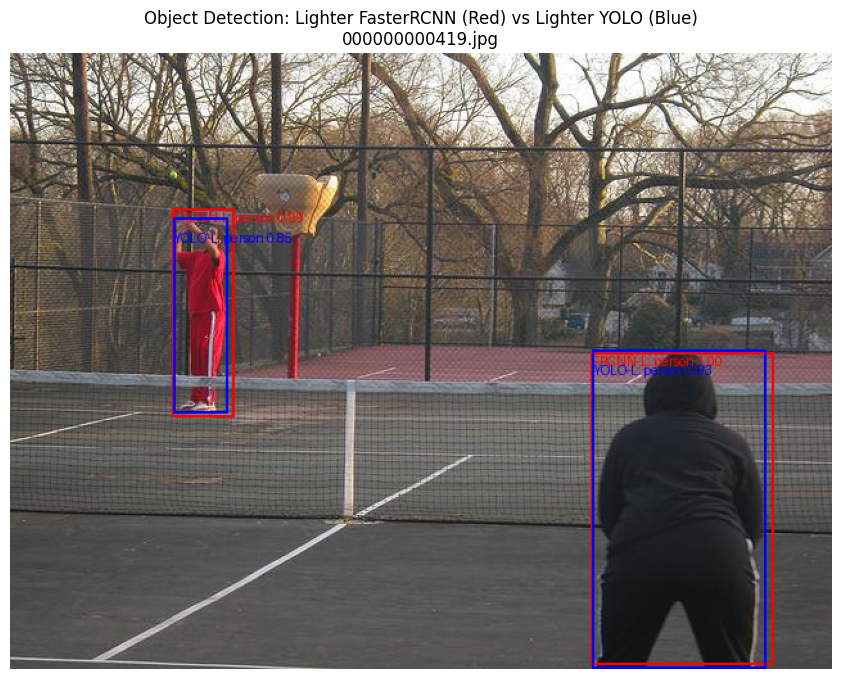

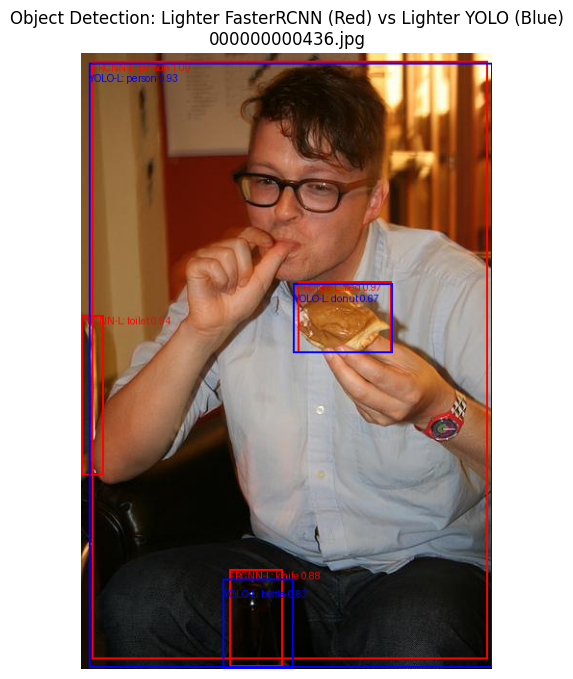

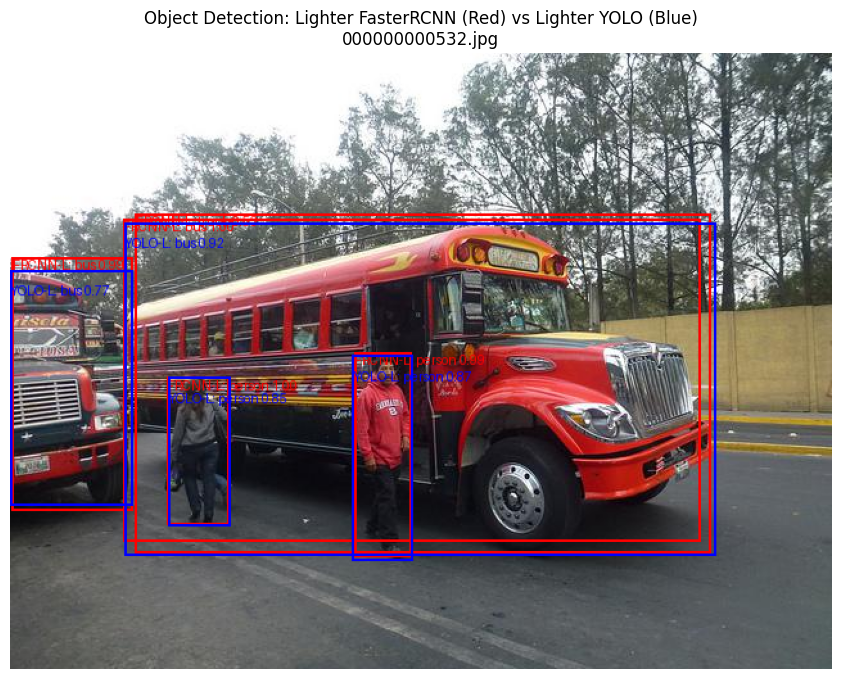

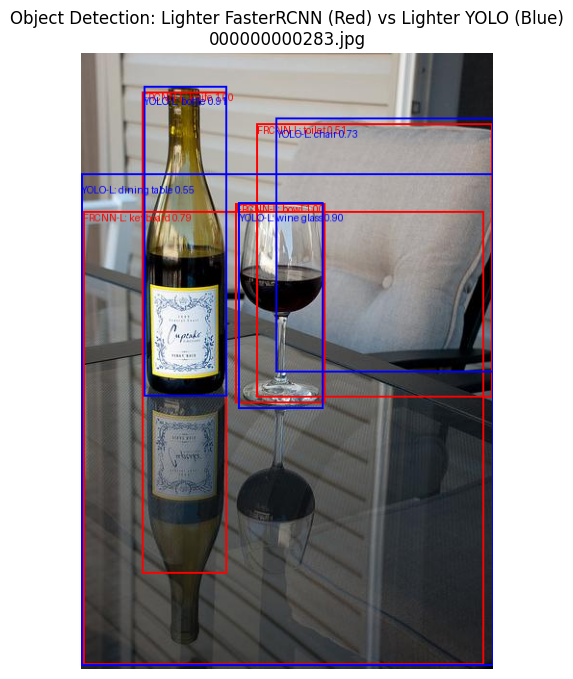

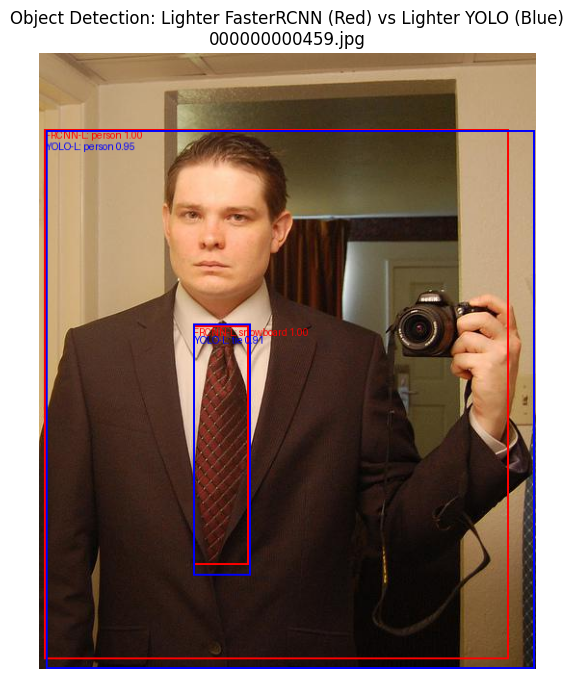

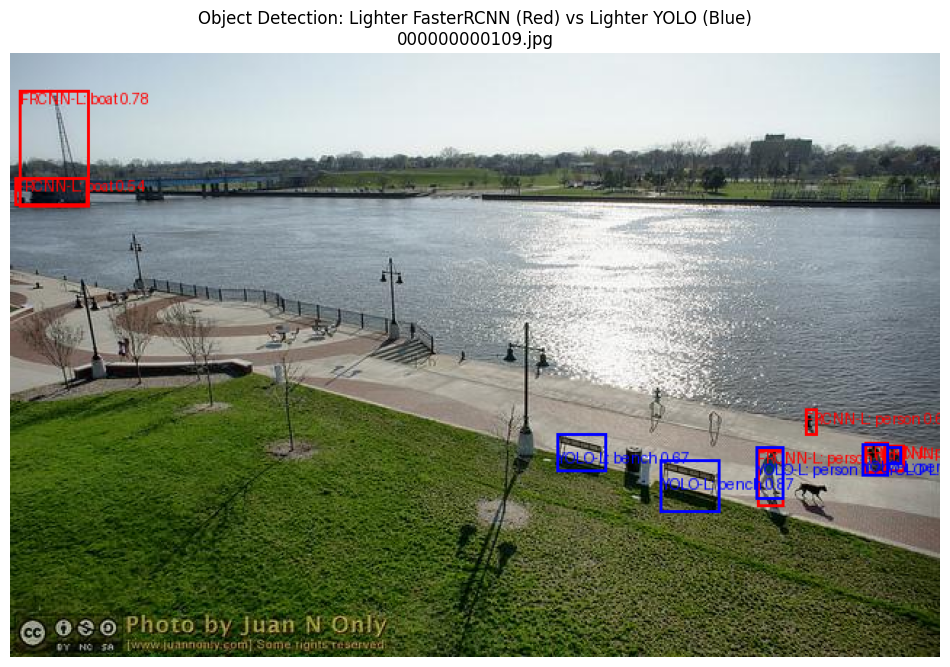

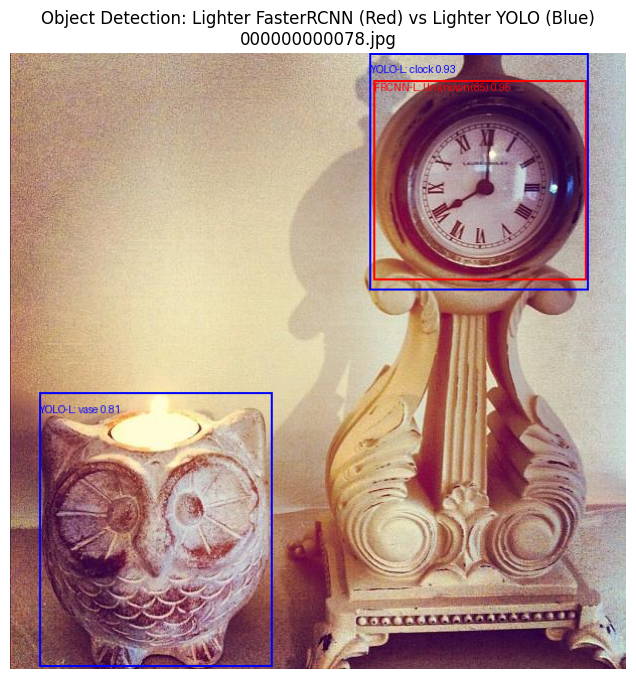

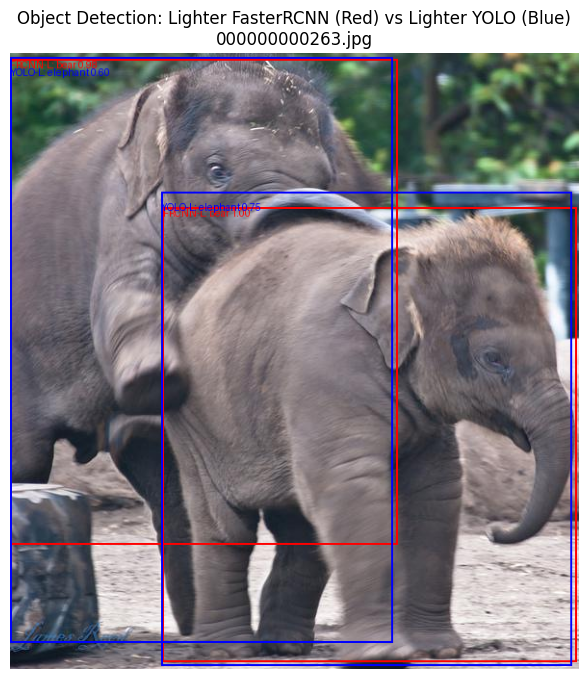

In [13]:
import random
import matplotlib.pyplot as plt
from PIL import ImageDraw, Image
import torch
import os

# Set the device to GPU if available, otherwise CPU.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move lighter_fasterrcnn_model and lighter_yolo_model to the device.
lighter_fasterrcnn_model.to(device)
lighter_yolo_model.to(device)

# Set both lighter_fasterrcnn_model and lighter_yolo_model to evaluation mode.
lighter_fasterrcnn_model.eval()
lighter_yolo_model.eval()

# Select a subset of 5 to 10 random image indices
num_images_to_visualize = 8
selected_indices = random.sample(range(len(lighter_fasterrcnn_dataset)), num_images_to_visualize)

# Get the list of selected image paths
all_img_paths = [os.path.join(lighter_fasterrcnn_dataset.img_dir, img_name) for img_name in lighter_fasterrcnn_dataset.imgs]
selected_img_paths = [all_img_paths[i] for i in selected_indices]

# Use class names from dataset
class_names = lighter_fasterrcnn_dataset.class_names

# Helper: safely get class name
def safe_class_name(label_id, offset=0):
    idx = label_id - offset
    if 0 <= idx < len(class_names):
        return class_names[idx]
    else:
        return f"Unknown({label_id})"

# Iterate through the selected images
for img_path in selected_img_paths:
    img = Image.open(img_path).convert("RGB")
    # Apply the FasterRCNN transform
    img_tensor = transform(img).to(device)

    # Run Lighter FasterRCNN
    with torch.no_grad():
        lighter_fasterrcnn_outputs = lighter_fasterrcnn_model([img_tensor])
    lighter_fasterrcnn_output = lighter_fasterrcnn_outputs[0]
    lighter_fasterrcnn_boxes = lighter_fasterrcnn_output['boxes'].cpu()
    lighter_fasterrcnn_scores = lighter_fasterrcnn_output['scores'].cpu()
    lighter_fasterrcnn_labels = lighter_fasterrcnn_output['labels'].cpu()

    # Run Lighter YOLO
    with torch.no_grad():
        lighter_yolo_results = lighter_yolo_model.predict(source=[img_path], verbose=False)
    lighter_yolo_result = lighter_yolo_results[0]
    if hasattr(lighter_yolo_result, 'boxes') and lighter_yolo_result.boxes is not None:
        lighter_yolo_boxes = lighter_yolo_result.boxes.xyxy.cpu()
        lighter_yolo_scores = lighter_yolo_result.boxes.conf.cpu()
        lighter_yolo_labels = lighter_yolo_result.boxes.cls.cpu().to(torch.int64)
    else:
        lighter_yolo_boxes = torch.empty((0, 4))
        lighter_yolo_scores = torch.empty((0,))
        lighter_yolo_labels = torch.empty((0,), dtype=torch.int64)

    # Draw boxes
    img_with_boxes = img.copy()
    draw = ImageDraw.Draw(img_with_boxes)

    # Lighter FasterRCNN boxes (Red)
    for box, score, label in zip(lighter_fasterrcnn_boxes, lighter_fasterrcnn_scores, lighter_fasterrcnn_labels):
        if score > 0.5:
            xmin, ymin, xmax, ymax = box.tolist()
            draw.rectangle([(xmin, ymin), (xmax, ymax)], outline="red", width=2)
            class_name = safe_class_name(label.item(), offset=1)  # 1-based correction
            draw.text((xmin, ymin), f"FRCNN-L: {class_name} {score:.2f}", fill="red")

    # Lighter YOLO boxes (Blue)
    for box, score, label in zip(lighter_yolo_boxes, lighter_yolo_scores, lighter_yolo_labels):
        if score > 0.5:
            xmin, ymin, xmax, ymax = box.tolist()
            draw.rectangle([(xmin, ymin), (xmax, ymax)], outline="blue", width=2)
            class_name = safe_class_name(label.item(), offset=0)  # YOLO uses 0-based
            draw.text((xmin, ymin + 10), f"YOLO-L: {class_name} {score:.2f}", fill="blue") # Place text slightly below FRCNN text

    # Show
    plt.figure(figsize=(12, 8))
    plt.imshow(img_with_boxes)
    plt.title(f"Object Detection: Lighter FasterRCNN (Red) vs Lighter YOLO (Blue)\n{os.path.basename(img_path)}")
    plt.axis("off")
    plt.show()

Building upon the quantitative comparison table and the qualitative visualizations, we can analyze the trade-offs and practical implications of using lighter variants of FasterRCNN and YOLO models compared to their base counterparts on the COCO128 dataset.

**Performance Trade-offs:**

The comparison table (see `df_comparison` above) clearly illustrates the performance trade-offs:

*   **FasterRCNN:** The lighter MobileNetV3-based FasterRCNN achieves a significantly lower mAP (0.0647) compared to the base ResNet50-based FasterRCNN (0.0713). However, this reduction in accuracy is accompanied by a substantial increase in inference speed (14.47 FPS vs 3.58 FPS, a ~4x speedup), a significant decrease in model size (74.14 MB vs 159.69 MB, ~2.1x smaller), and dramatically lower GPU memory usage (Peak: 987.12 MB vs 1488.78 MB; Reserved: 3048.00 MB vs 4840.00 MB).
*   **YOLO:** The lighter YOLOv8s variant demonstrates a slightly higher mAP (0.5446) than the base YOLOv8n (0.3790) on this dataset. While counter-intuitive, this could be attributed to YOLOv8s being a later and potentially more optimized architecture, even if conceptually 'lighter' than larger YOLOv8 variants (though still larger than v8n). It maintains a similar high inference speed (42.37 FPS vs 43.46 FPS), but has a larger model size (42.56 MB vs 12.02 MB) and higher memory usage (Peak: 376.02 MB vs 241.53 MB; Reserved: 482.00 MB vs 332.00 MB) compared to YOLOv8n.

**Architecture Impact:**

The architectural choices heavily influence these differences:

*   **FasterRCNN:** Replacing the heavy ResNet50 backbone with the more efficient MobileNetV3 significantly reduces the computational cost and parameter count, leading to a smaller model, faster inference, and lower memory footprint. The trade-off is a decrease in the feature extraction capability, which can impact detection accuracy, especially on more complex scenes.
*   **YOLO:** The progression from YOLOv8n to YOLOv8s involves changes in the network structure (like the C2f module and potentially wider layers) that, in this case, seem to improve accuracy on the COCO128 dataset while slightly increasing model size and memory compared to v8n, but still remaining far more efficient than FasterRCNN models.

**Practical Implications:**

The choice between base and lighter models depends heavily on the deployment environment and application requirements:

*   **Lighter Models (FasterRCNN-MobileNetV3, YOLOv8n/v8s):** These are ideal for resource-constrained environments such as edge devices, mobile phones, or applications requiring real-time processing where high FPS is critical. Their smaller size and lower memory footprint make deployment feasible on hardware with limited computational power and memory. The visualizations showed that lighter YOLO variants (v8s) maintain good detection quality on COCO128, while lighter FasterRCNN (MobileNetV3) might miss some smaller or less prominent objects compared to the base FasterRCNN, reflecting its lower mAP.
*   **Base Models (FasterRCNN-ResNet50):** These are better suited for applications where maximizing detection accuracy is the primary goal and computational resources are abundant, such as server-side processing of images or videos, offline analysis, or applications where missing a detection has significant consequences. The base FasterRCNN's ability to potentially produce more precise bounding boxes (though this wasn't strongly evident in the visualizations on this simple dataset) might be beneficial in tasks requiring high localization accuracy.

**Dataset Influence:**

The COCO128 dataset is a small subset of the larger COCO dataset. The observed relative performance, particularly the high mAP of YOLOv8s and the lower mAP of FasterRCNN variants, might be influenced by the dataset size and characteristics. On a larger, more diverse, and complex dataset like the full COCO or OpenImages, the larger capacity of the base FasterRCNN (ResNet50) might allow it to generalize better and achieve a higher mAP relative to the lighter variants. Similarly, the performance differences between YOLOv8n and YOLOv8s might change. However, the fundamental trade-off pattern – lighter models offering speed and efficiency at the cost of some potential accuracy – is expected to hold across datasets.

In summary, lighter models provide compelling advantages in terms of speed, size, and memory, making them essential for deployment in resource-limited scenarios. The base models, while more resource-intensive, retain the potential for higher accuracy, making them suitable for applications where performance is paramount and resources are available. The specific choice depends on a careful evaluation of the application's requirements and the available hardware.